In [1]:
from ucimlrepo import fetch_ucirepo 


# Load in our libraries
import pandas as pd
import numpy as np
import re
import sklearn
import xgboost as xgb
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls

import warnings
warnings.filterwarnings('ignore')

# Going to use these 5 base models for the stacking
from sklearn.ensemble import *
from sklearn.svm import SVC
from sklearn.model_selection import KFold

import os

from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

import math

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import math
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import clear_output
from sklearn import model_selection,linear_model,metrics

# Model Evaluation Metrics
from sklearn.metrics import classification_report, accuracy_score, precision_score,recall_score,f1_score
from sklearn import preprocessing

#Model Selection
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV ,StratifiedKFold
from sklearn.linear_model  import LogisticRegression, RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn import neighbors
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (AdaBoostClassifier , GradientBoostingClassifier, AdaBoostClassifier ,
                             RandomForestClassifier,RandomForestRegressor, BaggingClassifier)

In [2]:
# fetch dataset 
adult = fetch_ucirepo(id=2) 
  
# data (as pandas dataframes) 
X = adult.data.features 
y = adult.data.targets 
  
# metadata 
print(adult.metadata) 
  
# variable information 
print(adult.variables) 

{'uci_id': 2, 'name': 'Adult', 'repository_url': 'https://archive.ics.uci.edu/dataset/2/adult', 'data_url': 'https://archive.ics.uci.edu/static/public/2/data.csv', 'abstract': 'Predict whether income exceeds $50K/yr based on census data. Also known as "Census Income" dataset. ', 'area': 'Social Science', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 48842, 'num_features': 14, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Age', 'Income', 'Education Level', 'Other', 'Race', 'Sex'], 'target_col': ['income'], 'index_col': None, 'has_missing_values': 'yes', 'missing_values_symbol': 'NaN', 'year_of_dataset_creation': 1996, 'last_updated': 'Mon Aug 07 2023', 'dataset_doi': '10.24432/C5XW20', 'creators': ['Barry Becker', 'Ronny Kohavi'], 'intro_paper': None, 'additional_info': {'summary': 'Extraction was done by Barry Becker from the 1994 Census database.  A set of reasonably clean records was extracted using the following conditions: ((AAG

In [3]:
y

,income
0,<=50K
1,<=50K
2,<=50K
3,<=50K
4,<=50K
...,...
48837,<=50K.
48838,<=50K.
48839,<=50K.
48840,<=50K.


In [4]:
features_df = pd.DataFrame(X, columns=adult.features)
target_df = pd.DataFrame(y, columns=['income'])

In [109]:
features_df

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States
48838,64,NaN,321403,HS-grad,9,Widowed,NaN,Other-relative,Black,Male,0,0,40,United-States
48839,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States
48840,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States


In [5]:
target_df

,income
0,<=50K
1,<=50K
2,<=50K
3,<=50K
4,<=50K
...,...
48837,<=50K.
48838,<=50K.
48839,<=50K.
48840,<=50K.


In [9]:
# Number of unique values using nunique()
num_unique_values = target_df['income'].nunique()
print(f'Number of unique income values: {num_unique_values}')

Number of unique income values: 4


In [10]:
# Unique values using unique() and len()
unique_values = target_df['income'].unique()
print(f'Unique income values: {unique_values}')
print(f'Count of unique income values: {len(unique_values)}')

Unique income values: ['<=50K' '>50K' '<=50K.' '>50K.']
Count of unique income values: 4


The target variable contains similar classes with a slight variation in some entries (a period at the end).

To clean this up and ensure consistency across your target classes, we need to remove the trailing periods.

We can achieve this by using the str.replace() method provided by pandas:


In [11]:
# Remove the period at the end of the income strings
target_df['income'] = target_df['income'].str.replace(r'\.', '', regex=True)

# Verify the unique values again
unique_values_cleaned = target_df['income'].unique()
print(f'Cleaned unique income values: {unique_values_cleaned}')

Cleaned unique income values: ['<=50K' '>50K']


In [12]:
target_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   income  48842 non-null  object
dtypes: object(1)
memory usage: 381.7+ KB


In [13]:
features_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48842 entries, 0 to 48841
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             48842 non-null  int64 
 1   workclass       47879 non-null  object
 2   fnlwgt          48842 non-null  int64 
 3   education       48842 non-null  object
 4   education-num   48842 non-null  int64 
 5   marital-status  48842 non-null  object
 6   occupation      47876 non-null  object
 7   relationship    48842 non-null  object
 8   race            48842 non-null  object
 9   sex             48842 non-null  object
 10  capital-gain    48842 non-null  int64 
 11  capital-loss    48842 non-null  int64 
 12  hours-per-week  48842 non-null  int64 
 13  native-country  48568 non-null  object
dtypes: int64(6), object(8)
memory usage: 5.2+ MB


In [14]:
# Define a mapping dictionary where the original values are keys and the new numeric codes are values
mapping = {'<=50K': 0, '>50K': 1}

# Apply the mapping to the 'income' column and create a new DataFrame for the encoded values
encoded_target = target_df['income'].map(mapping)

# Check the first few rows to ensure it's encoded correctly
encoded_target

0        0
1        0
2        0
3        0
4        0
        ..
48837    0
48838    0
48839    0
48840    0
48841    1
Name: income, Length: 48842, dtype: int64

In [15]:
data = pd.concat([features_df, target_df], axis=1)
data

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48837,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
48838,64,NaN,321403,HS-grad,9,Widowed,NaN,Other-relative,Black,Male,0,0,40,United-States,<=50K
48839,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
48840,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


In [16]:
data.to_csv('data/adult_census_data.csv')

In [17]:
# Replace '?' with NaN only in specific columns
columns_to_check = ['workclass', 'occupation', 'native-country']  # Example columns
data[columns_to_check] = data[columns_to_check].replace('?', np.nan)

In [18]:
for each in data.columns:
    print('Percent of null values',each,':',data[each].isnull().mean()*100)

Percent of null values age : 0.0
Percent of null values workclass : 5.7307235575938735
Percent of null values fnlwgt : 0.0
Percent of null values education : 0.0
Percent of null values education-num : 0.0
Percent of null values marital-status : 0.0
Percent of null values occupation : 5.751197739650301
Percent of null values relationship : 0.0
Percent of null values race : 0.0
Percent of null values sex : 0.0
Percent of null values capital-gain : 0.0
Percent of null values capital-loss : 0.0
Percent of null values hours-per-week : 0.0
Percent of null values native-country : 1.7546374022357807
Percent of null values income : 0.0


In [19]:
# Fill missing values in 'workclass', 'occupation', and 'native-country' columns with the most common value (mode) of each column.
# The use of inplace=True modifies the original DataFrame 'data' directly without the need to assign it back.
for col in ['workclass', 'occupation', 'native-country']:
    data[col].fillna(data[col].mode()[0], inplace=True)


In [20]:
# Retrieve and store the indices of rows where the 'native-country' column has the value 'South' into the variable 'temp'.
temp = data[data["native-country"] == "South"].index


In [21]:
# Remove all rows from the 'data' DataFrame that have their indices listed in the 'temp' variable. 
# The operation is done in-place, meaning the original DataFrame is modified directly without creating a copy.
data.drop(temp, axis=0, inplace=True)


In [22]:
# Identify and list all categorical variables in the 'data' DataFrame. Categorical variables are defined as those columns 
# with data types of 'object' (denoted as 'O' in numpy) or boolean ('bool_'). This list comprehension checks each column's 
# data type and collects the names of categorical columns. The total number and names of these categorical variables 
# are then printed.
categorical_variables = [feature for feature in data.columns if data[feature].dtype in ['O', 'bool_']]
print('Number of categorical variables =>', len(categorical_variables), '\nCategorical Variables=>', categorical_variables)


Number of categorical variables => 9 
Categorical Variables=> ['workclass', 'education', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'native-country', 'income']


In [23]:
# Identify and list all numerical variables in the 'data' DataFrame. Numerical variables are defined as those columns
# with integer or floating-point data types. This list comprehension checks each column's data type against a set
# of numerical types (both integers and floats of various precisions) and collects the names of numerical columns.
# The total number of numerical variables and their names are then printed.
numerical_variables = [feature for feature in data.columns if data[feature].dtype in ['int_', 'int8', 'int16', 'int32', 'int64', 'uint8', 'uint16',
                               'uint32', 'uint64','float_', 'float16', 'float32','float64']]
print('Number of numerical variables =>', len(numerical_variables), '\nNumerical Variables=>', numerical_variables)


Number of numerical variables => 6 
Numerical Variables=> ['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week']


In [26]:
# Number of categories in categorical variables
total =0
for feature in categorical_variables:
    print(feature,'->',data[feature].nunique())
    total += data[feature].nunique()
print('Total category:',total)

workclass -> 8
education -> 16
marital-status -> 7
occupation -> 14
relationship -> 6
race -> 5
sex -> 2
native-country -> 40
income -> 2
Total category: 100


### PairPlot
Pairplots are a powerful diagnostic tool from the Seaborn visualization library, designed to provide a comprehensive overview of the relationships between multiple variables in a dataset. Here's what you need to know about pairplots:

### What is a Pairplot?
A pairplot creates a grid of scatter plots. Each plot represents the relationship between two variables, allowing for a pairwise comparison across your dataset. The variables are plotted against each other across the x- and y-axes of a matrix, with the same variables appearing on both axes.

### Key Features of Pairplots:
 - Grid Layout: Each row and column in the grid corresponds to one of the variables in your dataset, meaning each cell in the grid is a plot of two variables.
Diagonal Plots: The diagonal plots (where the row and column variables match) are typically replaced with a univariate distribution plot (histogram or density plot) that shows the distribution of the variable.

 - Hue for Categorization: The hue parameter allows plots to be colored based on a categorical variable, which helps in distinguishing data subsets based on the category (e.g., income levels). This adds a layer of information, showing how data points are distributed across different categories.

### Uses of Pairplots:
 - Exploratory Data Analysis: Pairplots are ideal for exploratory data analysis as they help in identifying trends, correlations, and anomalies in data.

 - Feature Selection: By examining pairplots, one can identify relevant variables that have strong relationships or interesting patterns, useful for feature selection in machine learning models.
 
 - Visual Comparison: With the hue parameter, pairplots facilitate visual comparisons across different subgroups in the data, enhancing understanding of how variables interact within these groups.

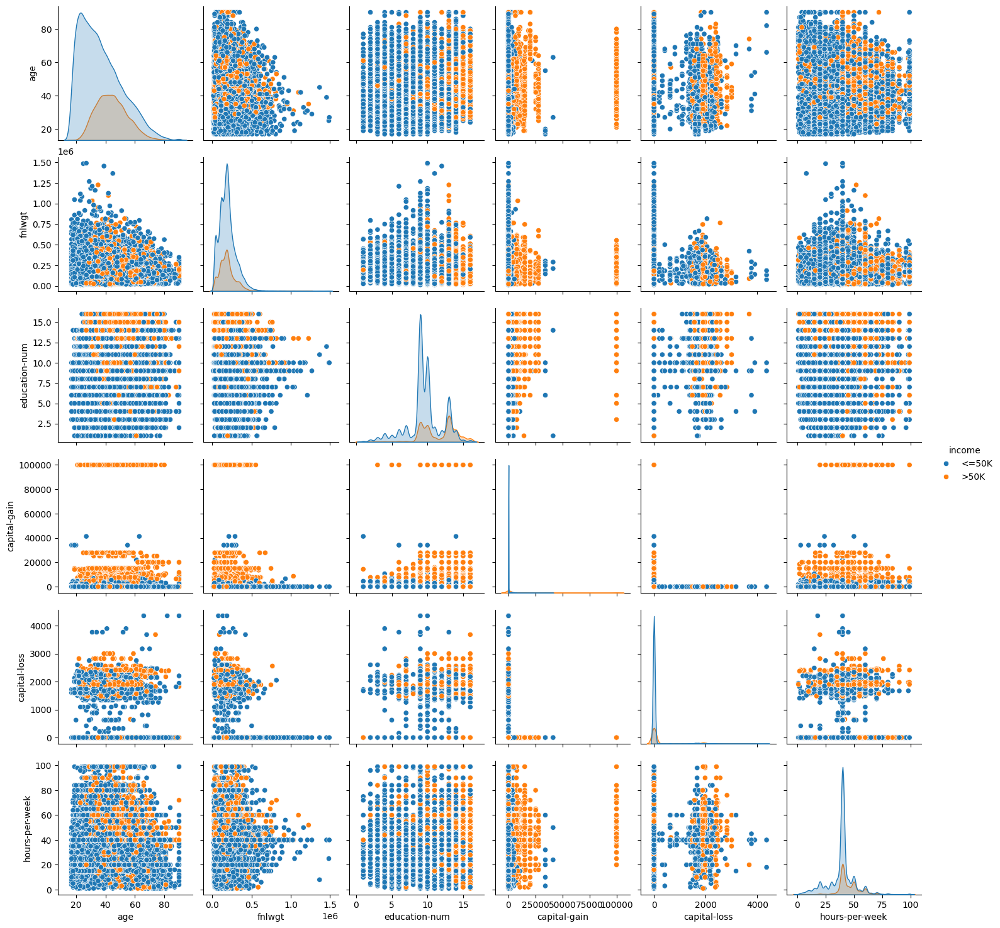

In [27]:
# Generate a pairplot of the 'data' DataFrame using Seaborn's pairplot function. This plot creates pairwise scatter plots 
# for all numerical variables in the DataFrame to visualize the relationships between them. The 'hue' parameter is set to 
# "income" to color the points according to the income category, allowing for visual differentiation of data points based 
# on the income classification.
sns.pairplot(data, hue = "income")

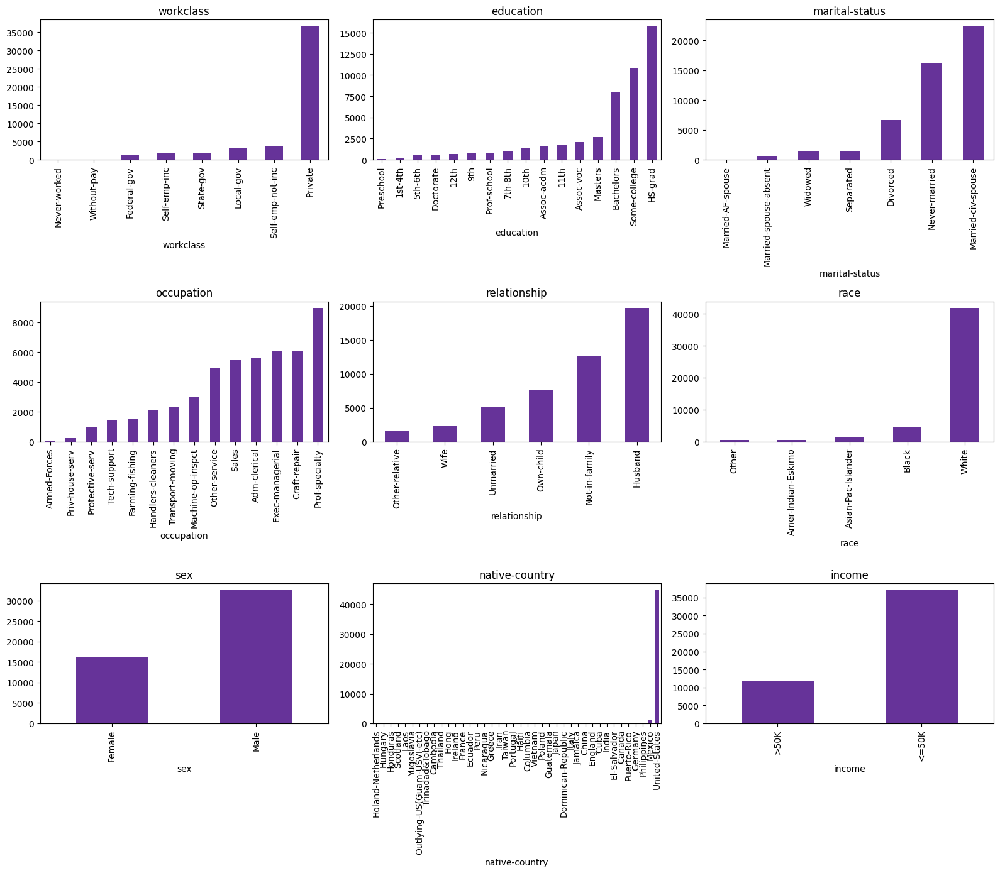

In [28]:
mor_palette = sns.cubehelix_palette(start=2.8, rot=0.1, dark=0.3, light=0.8, reverse=True)

fields=data.select_dtypes(exclude="number").columns

figuresize=(16,14)
cols=3
rows=math.ceil(len(fields)/cols)
#print()

plt.subplots(rows,cols,figsize=figuresize)
for i in range(1,len(fields)+1) :
    plt.subplot(rows,cols,i)
    data[fields[i-1]].value_counts().sort_values().plot.bar(color='#663399')  
    plt.xticks(rotation=90)
    plt.title(fields[i-1])
    
plt.tight_layout()
plt.show()

In [29]:
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("Unique values per Categorical feature", "Unique values per Numerical feature"))


temp_data=data.select_dtypes(exclude="number").nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#663399')),
    row=1, col=1
)



temp_data=data.select_dtypes(include="number").nunique().sort_values()

fig.add_trace(
    go.Bar(x=temp_data.index, y=temp_data.values,marker=dict(color='#D8BFD8')),
    row=1, col=2
)

#fig.update_layout(showlegend=False)
fig.show()


In [30]:
temp=dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12), 
                           height=500, width=1000))

target=data[['income']].value_counts(normalize=True).round(decimals=3)*100

#target.rename(index={1:'Default',0:'Paid'},inplace=True)

pal, color=['#DA70D6','#9932CC'], ['#DA70D6','#9932CC']
fig=go.Figure()

fig.add_trace(go.Pie(labels=target.index, values=target, hole=.5, 
                     showlegend=True,sort=False, 
                     marker=dict(colors=color,line=dict(color=pal,width=2.5)),
                     hovertemplate = "%{label} Income: %{value:.2f}%<extra></extra>"))

fig.update_layout(template=temp, title='Target Distribution', 
                  legend=dict(traceorder='reversed',y=1.05,x=0),
                  uniformtext_minsize=15, uniformtext_mode='hide',width=700)
fig.show()

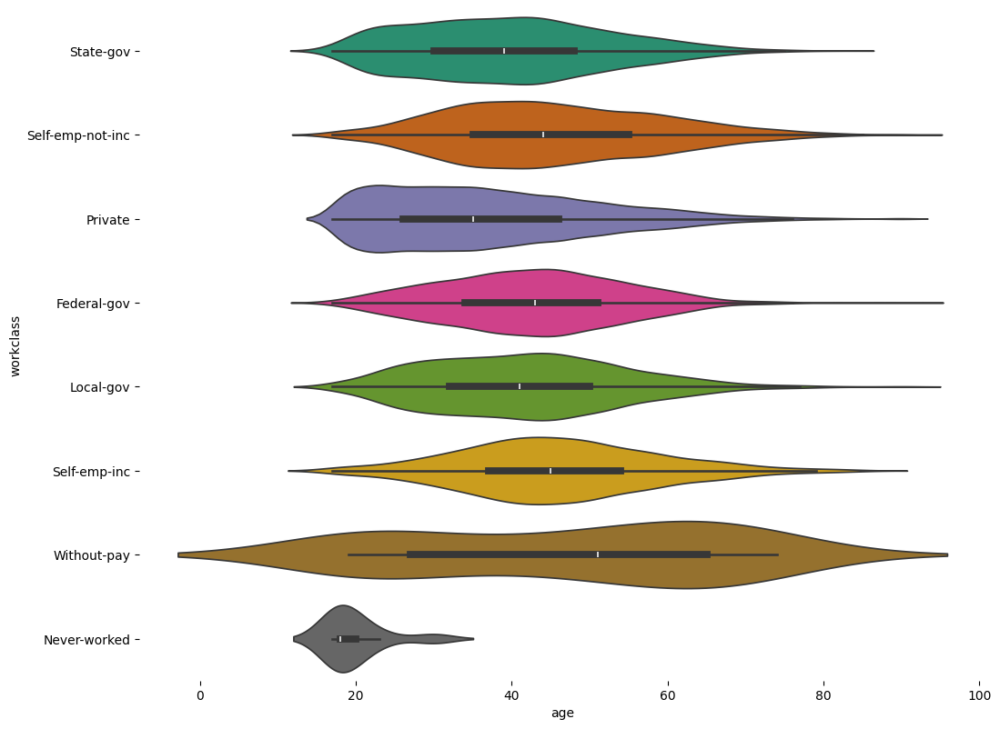

In [31]:
figsize = (12, 1.2 * len(data['workclass'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(data, x='age', y='workclass', inner='box', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

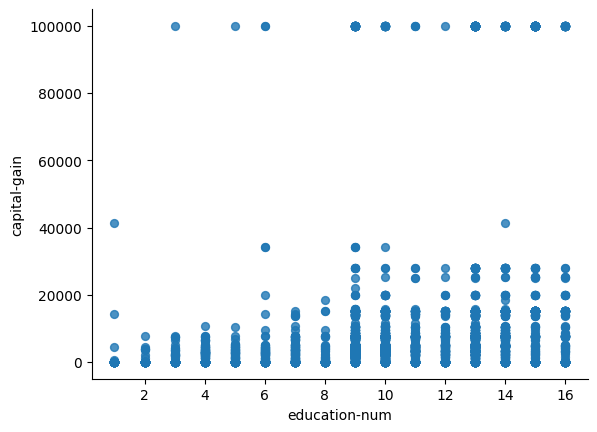

In [32]:
data.plot(kind='scatter', x='education-num', y='capital-gain', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

In [33]:
px.histogram(data, x='workclass', color="income", barmode='group',color_discrete_sequence=['#9932CC','#663399'])

In [34]:
px.histogram(data, x='education', color="income", barmode='group',color_discrete_sequence=['#9932CC','#663399'])

In [35]:
df1 = data.copy()
df1['education-num']= df1['education-num'].astype(int)
df1 = df1.sort_values(by='education-num')

px.histogram(df1, x='education-num', color="income", barmode='group',color_discrete_sequence=['#9932CC','#663399'])

In [36]:
px.histogram(data, x='marital-status', color="income", barmode='group',color_discrete_sequence=['#9932CC','#663399'])

In [37]:
px.histogram(data, x='occupation', color="income", barmode='group',color_discrete_sequence=['#9932CC','#663399'])

In [38]:
px.histogram(data, x='relationship', color="income", barmode='group',color_discrete_sequence=['#9932CC','#663399'])

In [39]:
px.histogram(data, x='race', color="income", barmode='group',color_discrete_sequence=['#9932CC','#663399'])

### Normalize to analyse

To normalize the data so that you can fairly compare the income distribution across races, you would want to adjust the counts so that they reflect proportions rather than absolute numbers. This allows for a comparison of the relative frequencies of income categories within each race.

Here is a general approach to normalizing the data in Python using Pandas:

Calculate the total count per race.
Divide the count of each income category within a race by the total count for that race. This gives you the proportion of each income category within each race.
Plot the normalized counts.

In [40]:

# Calculate proportions
proportion_data = (
    data.groupby('race')['income']
    .value_counts(normalize=True)  # This normalizes the income counts by race
    .rename('proportion')
    .reset_index()
)

# Plotting the normalized data
fig = px.histogram(
    proportion_data, 
    x='race', 
    y='proportion', 
    color='income',
    barmode='group'
)

fig.show()

In [41]:
px.histogram(data, x='sex', color="income", barmode='group',color_discrete_sequence=['#9932CC','#663399'])

In [42]:
# Amerika
data["native-country"] = data["native-country"].replace(['United-States'], 'US')
# Avrupa
data["native-country"] = data["native-country"].replace(['Greece','Holand-Netherlands','Poland',"England","Yugoslavia",
                                                        "Germany","Italy","Ireland","Hungary","France","Scotland",
                                                        "Portugal"], 'Europe')
# Asya
data["native-country"] = data["native-country"].replace(['Vietnam','China','Taiwan',"India","Philippines","Japan",
                                                        "Hong","Cambodia","Laos","Thailand"], 'Asia')
# diğer
data["native-country"] = data["native-country"].replace(['Mexico','Trinadad&Tobago','Canada',"Puerto-Rico",
                                                        "Honduras","Cuba","Peru","Nicaragua","Dominican-Republic",
                                                        "Haiti","El-Salvador","Columbia","Guatemala","Jamaica","Ecuador",
                                                        "Outlying-US(Guam-USVI-etc)","Iran"], 'Others')

In [43]:
px.histogram(data, x='native-country', color="income", barmode='group',color_discrete_sequence=['#DA70D6','#D8BFD8'])

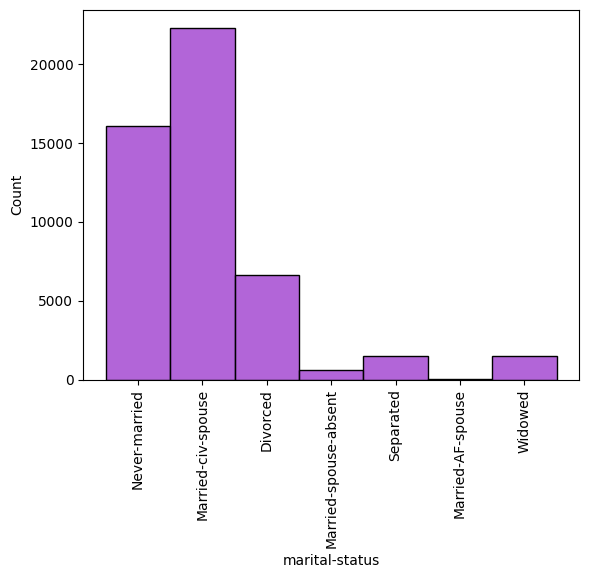

In [44]:
sns.histplot(x = data["marital-status"],color ="#9932CC")
plt.xticks(rotation=90)
plt.show()

In [45]:
data["marital-status"] = data["marital-status"].replace(['Divorced','Separated','Widowed'], 'Single')
data["marital-status"] = data["marital-status"].replace(['Married-civ-spouse','Married-spouse-absent',
                                                         'Married-AF-spouse'], 'Married')

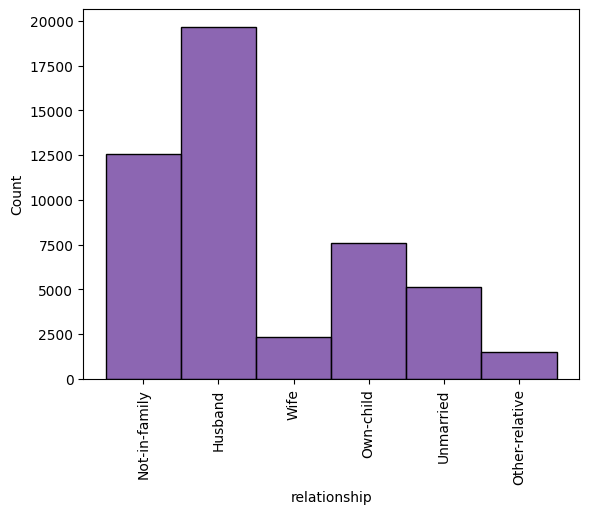

In [46]:
sns.histplot(x = data["relationship"],color ="#663399")
plt.xticks(rotation=90)
plt.show()

In [47]:
data["relationship"] = data["relationship"].replace(['Not-in-family','Other-relative'], 'Separated')
data["relationship"] = data["relationship"].replace(['Husband','Wife'], 'Married')
data["relationship"] = data["relationship"].replace(['Unmarried','Own-child'], 'Single')

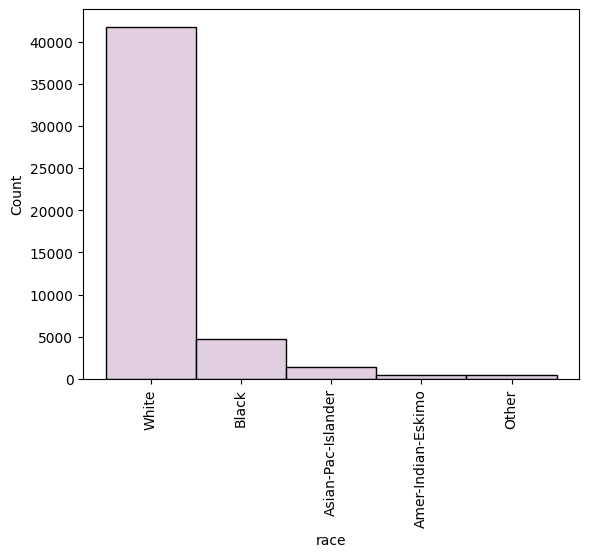

In [48]:
sns.histplot(x = data["race"],color ="#D8BFD8")
plt.xticks(rotation=90)
plt.show()

In [49]:
data["race"].value_counts()
data["race"] = data["race"].replace(['Asian-Pac-Islander','Amer-Indian-Eskimo','Other'], 'Other')

In [50]:
data["workclass"] = data["workclass"].replace(['Self-emp-not-inc','Local-gov',"State-gov","Self-emp-inc","Federal-gov",
                                              "Without-pay","Never-worked"], 'govermental')

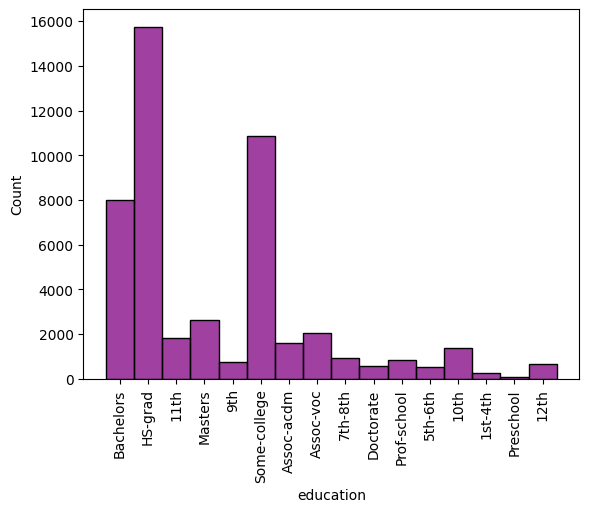

In [51]:
sns.histplot(x = data["education"],color = "#800080")
plt.xticks(rotation=90)
plt.show()

In [52]:
data["education"] = data["education"].replace(['Prof-school',"Assoc-acdm","Assoc-voc"], 'high-school')
data["education"] = data["education"].replace(['Some-college','Doctorate','Bachelors',"Masters"], 'college')
data["education"] = data["education"].replace(['7th-8th','10th','11th',"1st-4th","5th-6th","12th",
                                              "9th","Preschool"], 'pre-hs')

In [53]:
px.histogram(data, x='education', color="income", barmode='group',color_discrete_sequence=['#016CC9','#DEB078'])

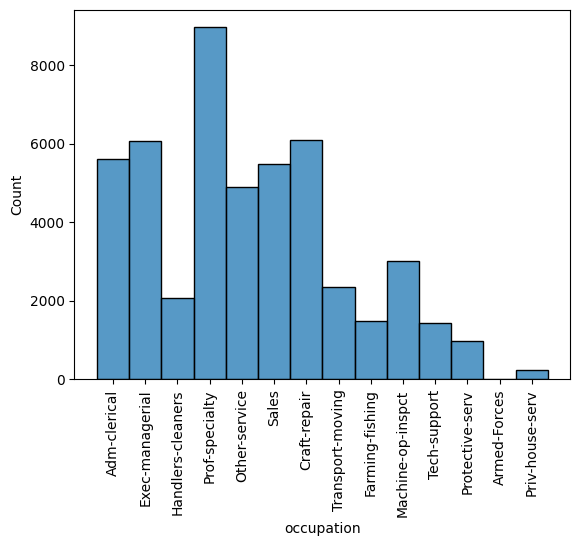

In [54]:
sns.histplot(x = data["occupation"])
plt.xticks(rotation=90)
plt.show()

In [55]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
data["education"] = le.fit_transform(data["education"])

In [56]:
categorical_variables2 = [feature for feature in data.columns if data[feature].dtype in ['O','bool_']]

# Outlier Detection using Inference

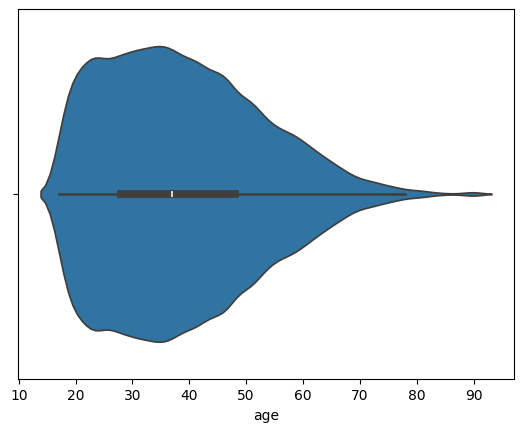

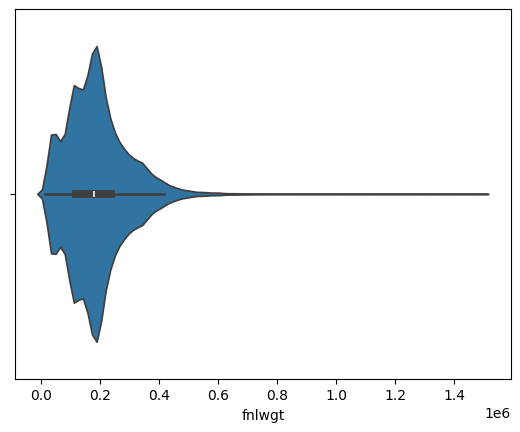

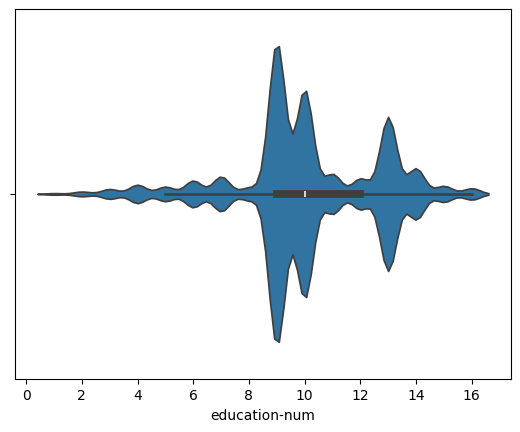

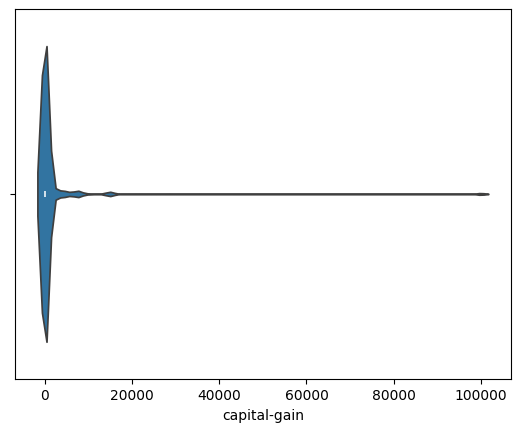

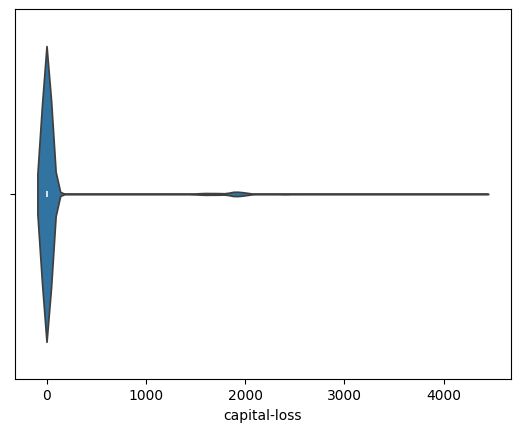

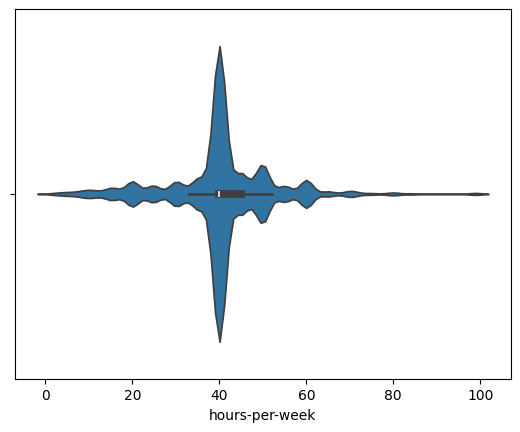

In [58]:
for c in data[numerical_variables]:
    plt.figure()
    sns.violinplot(x = c, data= data, orient = "v")

In [59]:
data.describe(percentiles=[.10,.25,.50,.75,.90])

,age,fnlwgt,education,education-num,capital-gain,capital-loss,hours-per-week
count,48727.000000,4.872700e+04,48727.000000,48727.000000,48727.000000,48727.000000,48727.000000
mean,38.644879,1.897172e+05,1.031707,10.076467,1077.653601,87.391939,40.416648
std,13.708591,1.056485e+05,0.969426,2.571137,7444.111576,402.759637,12.378291
min,17.000000,1.228500e+04,0.000000,1.000000,0.000000,0.000000,1.000000
10%,22.000000,6.571200e+04,0.000000,7.000000,0.000000,0.000000,24.000000
25%,28.000000,1.175490e+05,0.000000,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.782820e+05,1.000000,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.377130e+05,1.000000,12.000000,0.000000,0.000000,45.000000
90%,58.000000,3.285646e+05,3.000000,13.000000,0.000000,0.000000,55.000000
max,90.000000,1.490400e+06,3.000000,16.000000,99999.000000,4356.000000,99.000000


In [60]:
temp_columns = ["age","fnlwgt","education-num","hours-per-week"]

for each in data[temp_columns]:
    temp = 1.5
    IQR = data[each].quantile(0.85) - data[each].quantile(0.15)
    upper = data[each].quantile(0.90) + (temp*IQR)
    lower = data[each].quantile(0.10) - (temp*IQR)
    
    outlier_value_low = data[data[each]<lower].shape
    outlier_value_up = data[data[each]>upper].shape

    print("Column: ", each , ": " , "Upper limit: " , upper," lower limit: " , lower)
    print("below the limit shape: ", outlier_value_low , " Over border: " , outlier_value_up,"\n")
    
    data.loc[data[each]>upper,each] = upper
    data.loc[data[each]>lower,each] = lower
    
    print("After pressing")
    outlier_value_low = data[data[each]<lower].shape
    outlier_value_up = data[data[each]>upper].shape
    print("Column: ", each , ": " , "Upper limit: " , upper +1 ," lower limit: " , lower -1)
    print("below the limit shape: ", outlier_value_low , " Over border: " , outlier_value_up,"\n")
    print("----------------------------------------------------------------------------------\n")

Column:  age :  Upper limit:  103.0  lower limit:  -23.0
below the limit shape:  (0, 15)  Over border:  (0, 15) 

After pressing
Column:  age :  Upper limit:  104.0  lower limit:  -24.0
below the limit shape:  (0, 15)  Over border:  (0, 15) 

----------------------------------------------------------------------------------

Column:  fnlwgt :  Upper limit:  625606.6000000001  lower limit:  -231330.0
below the limit shape:  (0, 15)  Over border:  (174, 15) 

After pressing
Column:  fnlwgt :  Upper limit:  625607.6000000001  lower limit:  -231331.0
below the limit shape:  (0, 15)  Over border:  (0, 15) 

----------------------------------------------------------------------------------

Column:  education-num :  Upper limit:  19.0  lower limit:  1.0
below the limit shape:  (0, 15)  Over border:  (0, 15) 

After pressing
Column:  education-num :  Upper limit:  20.0  lower limit:  0.0
below the limit shape:  (0, 15)  Over border:  (0, 15) 

-------------------------------------------------

In [61]:
data = pd.get_dummies(data,columns = categorical_variables2, dtype="int64", drop_first=True)

In [62]:
data.shape

(48727, 32)

In [63]:
data.head()

,age,fnlwgt,education,education-num,capital-gain,capital-loss,hours-per-week,workclass_govermental,marital-status_Never-married,marital-status_Single,...,occupation_Transport-moving,relationship_Separated,relationship_Single,race_Other,race_White,sex_Male,native-country_Europe,native-country_Others,native-country_US,income_>50K
0,-23,-231330.0,1,1,2174,0,-6,1,1,0,...,0,1,0,0,1,1,0,0,1,0
1,-23,-231330.0,1,1,0,0,-6,1,0,0,...,0,0,0,0,1,1,0,0,1,0
2,-23,-231330.0,0,1,0,0,-6,0,0,1,...,0,1,0,0,1,1,0,0,1,0
3,-23,-231330.0,3,1,0,0,-6,0,0,0,...,0,0,0,0,0,1,0,0,1,0
4,-23,-231330.0,1,1,0,0,-6,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [64]:
data.to_csv('data/preprocessed/adult_census_data.csv')

In [65]:
X = data.drop(['income_>50K'], axis=1)

y = data['income_>50K']

In [66]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

# Estimate Feature importance using Random Forest

In [67]:
rf_fe_imp = RandomForestRegressor(n_estimators=500,n_jobs=-1)
rf_fe_imp.fit(X_train,y_train)
feature_importances = pd.DataFrame(zip(X.columns,rf_fe_imp.feature_importances_),
                                   columns=['Features','Importance Percentage']).sort_values(by='Importance Percentage',ascending=False)
feature_importances

,Features,Importance Percentage
4,capital-gain,0.315039
8,marital-status_Never-married,0.143022
9,marital-status_Single,0.142007
2,education,0.125307
5,capital-loss,0.092395
12,occupation_Exec-managerial,0.024057
18,occupation_Prof-specialty,0.019817
7,workclass_govermental,0.017330
27,sex_Male,0.015437
26,race_White,0.012900


In [68]:
feature_importances.loc[feature_importances['Importance Percentage']>0.01]

,Features,Importance Percentage
4,capital-gain,0.315039
8,marital-status_Never-married,0.143022
9,marital-status_Single,0.142007
2,education,0.125307
5,capital-loss,0.092395
12,occupation_Exec-managerial,0.024057
18,occupation_Prof-specialty,0.019817
7,workclass_govermental,0.017330
27,sex_Male,0.015437
26,race_White,0.012900


In [69]:
important_features = feature_importances.loc[feature_importances['Importance Percentage']>0.01]['Features'].values
important_features

array(['capital-gain', 'marital-status_Never-married',
       'marital-status_Single', 'education', 'capital-loss',
       'occupation_Exec-managerial', 'occupation_Prof-specialty',
       'workclass_govermental', 'sex_Male', 'race_White',
       'relationship_Single', 'relationship_Separated'], dtype=object)

In [73]:
X_train = X_train[important_features]
X_test = X_test[important_features]

In [74]:
from sklearn import preprocessing
stdandard_scale = preprocessing.StandardScaler()


X_train = pd.DataFrame(stdandard_scale.fit_transform(X_train), columns = X_train.columns)

X_test = pd.DataFrame(stdandard_scale.transform(X_test), columns = X_test.columns)

# Machine Learning Modelling

In [75]:
# Some useful parameters which will come in handy later on
ntrain = X_train.shape[0]
ntest = X_test.shape[0]
SEED = 0 # for reproducibility
NFOLDS = 5 # set folds for out-of-fold prediction
kf = KFold(n_splits= NFOLDS, random_state=SEED, shuffle=True)

In [76]:
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_array, check_is_fitted
from sklearn.utils.multiclass import unique_labels
from sklearn.svm import SVC
from sklearn.metrics import get_scorer
from sklearn.metrics.pairwise import laplacian_kernel
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


class RandomMachinesClassifier(BaseEstimator, ClassifierMixin):
    """Random Machines Classifier
    Parameters
    ----------
    cost : float, default=1
        Regularization parameter. The strength of the regularization is
        inversely proportional to C. Must be strictly positive. The penalty
        is a squared l2 penalty.
    degree : int, default=2
        Degree of the polynomial kernel function ('poly').
        Ignored by all other kernels.
    coef0_poly : float, default=0.0
        Independent term in kernel function.
        It is only significant in 'poly' kernel.
    boots_size : int, default=25
        Number of bootstrap samples.
    seed_bootstrap : int, default=None
        Seed for bootstrap and kernel selection.
    metric : str, default='accuracy'
        Metric used to evaluate the model.
    poly_scale : float, default=2
        Kernel coefficient for 'poly'.
    gamma_rbf : float, default=1
        Kernel coefficient for 'rbf'.
    gamma_lap : float, default=1
        Kernel coefficient for 'laplacian'.
    automatic_tuning : bool, default=False
        If True, gamma_rbf and gamma_lap are tuned automatically.

    References
    ----------
    .. [1] `Random Machines: A Bagged-Weighted Support Vector Model with Free Kernel Choice
        <https://jds-online.org/journal/JDS/article/899/info>`_
    Examples
    --------
    >>>from sklearn import datasets
    >>>from pyrmachines import RandomMachinesClassifier
    >>>from sklearn.model_selection import train_test_split
    >>>iris = datasets.load_iris()
    >>>X= iris.data
    >>>y= iris.target
    >>>X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=11)
    >>>rm = RandomMachinesClassifier(seed_bootstrap=123)
    >>>rm.fit(X_train, y_train)
    >>>predict = rm.predict(X_test)
    >>>print(predict)
    """

    def __init__(self,
                 poly_scale=2,
                 coef0_poly=0,
                 gamma_rbf=1,
                 gamma_lap=1,
                 degree=2,
                 cost=1,
                 metric='accuracy',
                 boots_size=25, seed_bootstrap=None, automatic_tuning=False):

        self.poly_scale = poly_scale
        self.coef0_poly = coef0_poly
        self.gamma_rbf = gamma_rbf
        self.gamma_lap = gamma_lap
        self.degree = degree
        self.cost = cost
        self.metric = metric
        self.boots_size = boots_size
        self.seed_bootstrap = seed_bootstrap
        self.automatic_tuning = automatic_tuning

    def fit(self, X, y):
        """Fit the Random Machines Classifier model according to the given training data.

        Parameters
        ----------
        X : {array-like, sparse matrix} of shape (n_samples, n_features) \
                or (n_samples, n_samples)
            Training vectors, where `n_samples` is the number of samples
            and `n_features` is the number of features.
            For kernel="precomputed", the expected shape of X is
            (n_samples, n_samples).

        y : array-like of shape (n_samples,)
            Target values (class labels in classification, real numbers in
            regression).

        sample_weight : array-like of shape (n_samples,), default=None
            Per-sample weights. Rescale C per sample. Higher weights
            force the classifier to put more emphasis on these points.

        Returns
        -------
        self : object
            Fitted estimator.
        """

        # Check that X and y have correct shape
        X, y = check_X_y(X, y)
        # Store the classes seen during fit
        self.classes_ = unique_labels(y)
        self.X_ = X
        self.y_ = y

        # Set seed for bootstrap and kernel selection
        if (self.seed_bootstrap is not None):
            np.random.seed(self.seed_bootstrap)

        # Kernel types
        kernel_type = ["linear", "poly", "rbf", "laplacian"]

        # Training single model and calculating accuracy
        early_models = []

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, random_state=self.seed_bootstrap, test_size=0.3)

        for kernel in kernel_type:
            model = self.fit_kernel(X_train, y_train, kernel)
            # predict = model.predict(X_test)
            # accuracy = accuracy_score(y_test, predict)
            metric_score = get_scorer(self.metric)(model, X_test, y_test)
            if (metric_score == 1):
                metric_score_log = 6.906755
            elif (metric_score <= 0.5):
                metric_score_log = 0
            else:
                # metric_score_log = np.log(np.divide(metric_score, np.subtract(1, metric_score)))
                metric_score_log = np.log(metric_score / (1 - metric_score))
            if (np.isinf(metric_score_log)):
                metric_score_log = 1
            early_models.append(
                {'kernel': kernel, "model": model, 'metric_score': metric_score, 'metric_score_log': metric_score_log})
            # print(f"Kernel: {kernel} - Score: {metric_score} - Log: {metric_score_log}")

        # Calculating the probability of each kernel
        prob_weights_sum = sum(item["metric_score_log"]
                               for item in early_models)
        lambda_values = {}
        for model in early_models:
            prob_weights = max(model["metric_score_log"] / prob_weights_sum, 0)
            # if (prob_weights < 0):
            #     prob_weights = 0
            model["prob_weights"] = prob_weights
            lambda_values[model["kernel"]] = prob_weights
            print(
                f"Kernel: {model['kernel']} - Score: {model['metric_score']} - Prob_weights: {prob_weights}")

        #  sampling a kernel function with probability = lambda_values
        p = [item["prob_weights"] for item in early_models]
        random_kernel = np.random.choice(
            kernel_type, self.boots_size, replace=True, p=p)

        # Creating the bootstrap sample
        boots_samples_index = []
        for i in range(self.boots_size):
            nrow = len(X)
            # nclass = len(self.classes_)
            train_index = np.random.choice(
                range(nrow), size=nrow, replace=True)
            table = np.unique(y[train_index], return_counts=True)
            ntable = len(table[0])
            while (ntable < 2):
                train_index = np.random.choice(
                    range(nrow), size=nrow, replace=True)
                table = np.unique(y[train_index], return_counts=True)
                ntable = len(table[0])
            boots_samples_index.append(train_index)

        # Training the models
        models = []
        for index in range(len(random_kernel)):
            kernel = random_kernel[index]
            boot_sample_index = boots_samples_index[index]
            X_train = X[boot_sample_index]
            y_train = y[boot_sample_index]
            X_test = np.delete(X, boot_sample_index, axis=0)
            y_test = np.delete(y, boot_sample_index, axis=0)
            model = self.fit_kernel(X_train, y_train, kernel)
            # out of bag
            # predict_oobg = model.predict(X_test)
            # accuracy = accuracy_score(y_test, predict_oobg)
            metric_score = get_scorer(self.metric)(model, X_test, y_test)
            if (metric_score == 1):
                kernel_weight = 120
            else:
                kernel_weight = 1 / ((1 - metric_score))
            print(
                f"Kernel: {kernel} - Score: {metric_score} - Weight: {kernel_weight}")
            models.append({'model': model, 'kernel': kernel,
                           'accuracy': metric_score, 'kernel_weight': kernel_weight, index: boot_sample_index})
        self.models = models

        return self

    def predict(self, X):
        """Perform classification on samples in X.

        Parameters
        ----------
        X : {array-like, sparse matrix} of shape (n_samples, n_features) or \
                (n_samples_test, n_samples_train)
            For kernel="precomputed", the expected shape of X is
            (n_samples_test, n_samples_train).

        Returns
        -------
        y_pred : ndarray of shape (n_samples,)
            Class labels for samples in X.
        """
        # Check if fit has been called
        check_is_fitted(self)
        # Input validation
        X = check_array(X)

        nrow = X.shape[0]
        ncol = len(self.classes_)
        models = self.models
        predict_df = pd.DataFrame(
            np.zeros((nrow, ncol)), columns=self.classes_)
        for model in models:
            model_weights = model["kernel_weight"]
            predict = model["model"].predict(X)
            for i in range(len(predict)):
                predict_df.loc[i, predict[i]] += model_weights
        return list(predict_df.idxmax(axis=1))

    def sigest(self, X):
        frac = 0.5
        x = X.copy()
        scaler = StandardScaler()
        x = scaler.fit_transform(x)
        m = x.shape[0]
        n = int(np.floor(frac * m))
        index = np.random.choice(m, n, replace=True)
        index2 = np.random.choice(m, n, replace=True)
        temp = x[index] - x[index2]
        dist = np.sum(temp**2, axis=1)
        srange = 1 / np.quantile(dist[dist != 0], q=[0.9, 0.5, 0.1])
        return srange[1]

    def fit_kernel(self, X_train, y_train, kernel):
        if (kernel == "linear"):
            model = SVC(kernel="linear",
                        C=self.cost,
                        probability=False,
                        verbose=0).fit(X_train, y_train)
        elif (kernel == "poly"):
            model = SVC(kernel="poly",
                        C=self.cost,
                        gamma=self.poly_scale,
                        probability=False,
                        coef0=self.coef0_poly,
                        degree=self.degree,
                        verbose=0).fit(X_train, y_train)
        elif (kernel == "rbf"):
            model = SVC(kernel="rbf",
                        C=self.cost,
                        probability=False,
                        gamma=self.sigest(
                            X_train) if self.automatic_tuning else self.gamma_rbf,
                        verbose=0).fit(X_train, y_train)
        elif (kernel == "laplacian"):
            model = SVC(kernel=laplacian_kernel,
                        gamma=self.sigest(
                            X_train) if self.automatic_tuning else self.gamma_lap,
                        C=self.cost,
                        probability=False,
                        verbose=0).fit(X_train, y_train)
        return model

In [77]:
# Class to extend the Sklearn classifier
class base_classifier(object):
    def __init__(self, model, seed=0, params=None):
        params['random_state'] = seed
        self.model = model(**params)

    def fit(self, x_train, y_train):
        self.model.fit(x_train, y_train)

    def predict(self, x):
        return self.model.predict(x)
    
    def fit(self,x,y):
        return self.model.fit(x,y)
    
    def feature_importances(self,x,y):
        return self.model.fit(x,y).feature_importances_

In [78]:
# Put in our parameters for said classifiers
# Random Forest parameters
rf_params = {
    'n_jobs': -1,
    'n_estimators': 500,
     'warm_start': True, 
     #'max_features': 0.2,
    'max_depth': 6,
    'min_samples_leaf': 2,
    'max_features' : 'sqrt',
    'verbose': 0
}

# Extra Trees Parameters
et_params = {
    'n_jobs': -1,
    'n_estimators':500,
    #'max_features': 0.5,
    'max_depth': 8,
    'min_samples_leaf': 2,
    'verbose': 0
}

# AdaBoost parameters
ada_params = {
    'n_estimators': 500,
    'learning_rate' : 0.75
}

# Gradient Boosting parameters
gb_params = {
    'n_estimators': 500,
     #'max_features': 0.2,
    'max_depth': 5,
    'min_samples_leaf': 2,
    'verbose': 0
}

# Support Vector Classifier parameters 
svc_params = {
    'kernel' : 'linear',
    'C' : 0.025
    }


# Create 5 objects that represent our 4 models
rf = base_classifier(model=RandomForestClassifier, seed=SEED, params=rf_params)
et = base_classifier(model=ExtraTreesClassifier, seed=SEED, params=et_params)
ada = base_classifier(model=AdaBoostClassifier, seed=SEED, params=ada_params)
gb = base_classifier(model=GradientBoostingClassifier, seed=SEED, params=gb_params)
svc = base_classifier(model=SVC, seed=SEED, params=svc_params)

In [80]:
import numpy as np
from sklearn.model_selection import KFold

# Assuming the number of folds, the classifier, and the training/testing data are defined correctly
# ntrain, ntest should be the number of samples in your training and test datasets respectively
# NFOLDS is the number of folds you want to use
# clf should have a 'train' method that fits the classifier and a 'predict' method that makes predictions

def get_oof(clf, x_train, y_train, x_test):
    ntrain = x_train.shape[0]
    ntest = x_test.shape[0]
    NFOLDS = 5  # Or another number of folds you wish to use
    kf = KFold(n_splits=NFOLDS, shuffle=True, random_state=42)

    oof_train = np.zeros((ntrain,))
    oof_test = np.zeros((ntest,))
    oof_test_skf = np.empty((NFOLDS, ntest))

    for i, (train_index, test_index) in enumerate(kf.split(x_train)):
        x_tr = x_train.iloc[train_index]
        y_tr = y_train.iloc[train_index]
        x_te = x_train.iloc[test_index]

        clf.fit(x_tr, y_tr)

        oof_train[test_index] = clf.predict(x_te).reshape(-1)
        oof_test_skf[i, :] = clf.predict(x_test).reshape(-1)

    oof_test[:] = oof_test_skf.mean(axis=0)
    return oof_train.reshape(-1, 1), oof_test.reshape(-1, 1)

# Example usage:
# et_oof_train, et_oof_test = get_oof(et, X_train, y_train, X_test) # Extra Trees
# and so on for the other classifiers


In [81]:
X_train[important_features]

,capital-gain,marital-status_Never-married,marital-status_Single,education,capital-loss,occupation_Exec-managerial,occupation_Prof-specialty,workclass_govermental,sex_Male,race_White,relationship_Single,relationship_Separated
0,-0.144858,-0.70327,2.006547,0.996206,-0.216311,-0.374995,-0.475652,-0.574191,0.703549,0.408856,-0.594371,1.568752
1,-0.144858,-0.70327,-0.498369,-0.035637,-0.216311,-0.374995,-0.475652,-0.574191,0.703549,0.408856,-0.594371,-0.637449
2,1.254673,-0.70327,2.006547,-0.035637,-0.216311,-0.374995,2.102377,1.741582,0.703549,0.408856,-0.594371,1.568752
3,-0.144858,-0.70327,-0.498369,-0.035637,-0.216311,-0.374995,-0.475652,-0.574191,0.703549,0.408856,-0.594371,-0.637449
4,-0.144858,-0.70327,2.006547,-1.067480,-0.216311,2.666701,-0.475652,-0.574191,0.703549,0.408856,-0.594371,1.568752
...,...,...,...,...,...,...,...,...,...,...,...,...
34103,-0.144858,-0.70327,-0.498369,-0.035637,-0.216311,-0.374995,-0.475652,-0.574191,0.703549,-2.445852,-0.594371,-0.637449
34104,-0.144858,-0.70327,-0.498369,-0.035637,-0.216311,-0.374995,-0.475652,-0.574191,0.703549,0.408856,-0.594371,-0.637449
34105,-0.144858,-0.70327,-0.498369,0.996206,-0.216311,-0.374995,-0.475652,-0.574191,0.703549,0.408856,-0.594371,-0.637449
34106,-0.144858,-0.70327,-0.498369,2.028049,-0.216311,2.666701,-0.475652,-0.574191,0.703549,0.408856,-0.594371,-0.637449


In [82]:
X_imp_train = X_train[important_features]
X_imp_test = X_test[important_features]

In [83]:
# Create our OOF train and test predictions. These base results will be used as new features
et_oof_train, et_oof_test = get_oof(et, X_imp_train, y_train, X_imp_test,important_features) # Extra Trees
rf_oof_train, rf_oof_test = get_oof(rf,X_imp_train, y_train, X_imp_test,important_features) # Random Forest
ada_oof_train, ada_oof_test = get_oof(ada, X_imp_train, y_train, X_imp_test,important_features) # AdaBoost 
gb_oof_train, gb_oof_test = get_oof(gb,X_imp_train, y_train, X_imp_test,important_features) # Gradient Boost
svc_oof_train, svc_oof_test = get_oof(svc,X_imp_train, y_train, X_imp_test,important_features) # Support Vector Classifier

print("Training is complete")

Training is complete


In [85]:
# Feature importance

rf_features = rf.feature_importances(X_train,y_train)
et_features = et.feature_importances(X_train, y_train)
ada_features = ada.feature_importances(X_train, y_train)
gb_features = gb.feature_importances(X_train,y_train)

In [87]:
rf_features

array([0.29531349, 0.16820283, 0.06112945, 0.05694379, 0.06266301,
       0.05131705, 0.01826989, 0.00458472, 0.04396077, 0.00118511,
       0.13381105, 0.10261885])

In [89]:
cols = X_imp_train.values
cols

array([[-0.14485765, -0.70326973,  2.0065469 , ...,  0.40885554,
        -0.59437131,  1.56875246],
       [-0.14485765, -0.70326973, -0.49836861, ...,  0.40885554,
        -0.59437131, -0.6374492 ],
       [ 1.2546732 , -0.70326973,  2.0065469 , ...,  0.40885554,
        -0.59437131,  1.56875246],
       ...,
       [-0.14485765, -0.70326973, -0.49836861, ...,  0.40885554,
        -0.59437131, -0.6374492 ],
       [-0.14485765, -0.70326973, -0.49836861, ...,  0.40885554,
        -0.59437131, -0.6374492 ],
       [-0.14485765, -0.70326973, -0.49836861, ...,  0.40885554,
        -0.59437131, -0.6374492 ]])

In [90]:

# Create a dataframe with features
# Create a dataframe from the lists containing the feature importance data for easy plotting via the Plotly package.
feature_dataframe = pd.DataFrame( {'features': important_features,
     'Random Forest feature importances': rf_features,
     'Extra Trees  feature importances': et_features,
      'AdaBoost feature importances': ada_features,
    'Gradient Boost feature importances': gb_features
    })

In [91]:
# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Random Forest feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Random Forest feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Random Forest Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Extra Trees  feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Extra Trees  feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Extra Trees Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['AdaBoost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['AdaBoost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'AdaBoost Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Scatter plot 
trace = go.Scatter(
    y = feature_dataframe['Gradient Boost feature importances'].values,
    x = feature_dataframe['features'].values,
    mode='markers',
    marker=dict(
        sizemode = 'diameter',
        sizeref = 1,
        size = 25,
#       size= feature_dataframe['AdaBoost feature importances'].values,
        #color = np.random.randn(500), #set color equal to a variable
        color = feature_dataframe['Gradient Boost feature importances'].values,
        colorscale='Portland',
        showscale=True
    ),
    text = feature_dataframe['features'].values
)
data = [trace]

layout= go.Layout(
    autosize= True,
    title= 'Gradient Boosting Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig,filename='scatter2010')

# Create the new column containing the average of values
feature_dataframe.set_index('features', inplace=True)
feature_dataframe['mean'] = feature_dataframe.mean(axis= 1) # axis = 1 computes the mean row-wise

y = feature_dataframe['mean'].values
x = feature_dataframe.index.values

data = [go.Bar(
            x= x,
             y= y,
            width = 0.5,
            marker=dict(
               color = feature_dataframe['mean'].values,
            colorscale='Portland',
            showscale=True,
            reversescale = False
            ),
            opacity=0.6
        )]
layout= go.Layout(
    autosize= True,
    title= 'Barplots of Mean Feature Importance',
    hovermode= 'closest',
#     xaxis= dict(
#         title= 'Pop',
#         ticklen= 5,
#         zeroline= False,
#         gridwidth= 2,
#     ),
    yaxis=dict(
        title= 'Feature Importance',
        ticklen= 5,
        gridwidth= 2
    ),
    showlegend= False
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bar-direct-labels')

base_predictions_train = pd.DataFrame( {'RandomForest': rf_oof_train.ravel(),
     'ExtraTrees': et_oof_train.ravel(),
     'AdaBoost': ada_oof_train.ravel(),
      'GradientBoost': gb_oof_train.ravel()
    })
base_predictions_train.head()

data = [
    go.Heatmap(
        z= base_predictions_train.astype(float).corr().values ,
        x=base_predictions_train.columns.values,
        y= base_predictions_train.columns.values,
          colorscale='Viridis',
            showscale=True,
            reversescale = True
    )
]
py.iplot(data, filename='labelled-heatmap')

In [92]:
meta_x_train = np.concatenate(( et_oof_train, rf_oof_train, ada_oof_train, gb_oof_train, svc_oof_train), axis=1)
meta_x_test = np.concatenate(( et_oof_test, rf_oof_test, ada_oof_test, gb_oof_test, svc_oof_test), axis=1)

#y_train_0_1 = np.where(y_train == -1, 0, 1)

#y_test_0_1 = np.where(y_test == -1, 0, 1)

In [ ]:
gbm = xgb.XGBClassifier(
    learning_rate = 0.02,
    n_estimators= 2000,
    max_depth= 4,
    min_child_weight= 2,
    #gamma=1,
    gamma=0.9,                        
    subsample=0.8,
    colsample_bytree=0.8,
    objective= 'binary:logistic',
    nthread= -1,
    scale_pos_weight=1).fit(meta_x_train, y_train)
predictions = gbm.predict(meta_x_test)

print(f'Accuracy is: {sum(y_test==np.asarray(predictions))/y_test.shape[0]}')

In [97]:

rmachines = RandomMachinesClassifier()
meta_model = rmachines.fit(meta_x_train,y_train)

: 

In [ ]:
predictions = meta_model.predict(meta_x_test)

print(f'Accuracy is: {sum(y_test==np.asarray(predictions))/y_test.shape[0]}')